In [12]:
#Importing Modules
import numpy as np
import matplotlib.pyplot as plt
from astropy.io import fits
#provides access to fits (flexible image transport system) files
from matplotlib.pyplot import cm 
from astropy.wcs import WCS
#transformation from the real position of an object on the celestial sphere to the position on a cartesian plane
%matplotlib inline

In [13]:
#converting from wavelength to velocity
def rb_veldiff(waverest,wave):
    spl=2.9979e5;  #speed of light
    vel = (waverest-wave*(1.0 + 0.))*spl/(wave*(1.0 + 0.))
    return vel



In [14]:
#opening the fits files
# Open the co-added flux cube
'''
tab (probably table) is just a variable that now holds the data from the fits files, 
so you can tabulate through the data to get values at certain positions
'''
tab=fits.open('coadd_spectrum.fits')
flux=tab[0].data #flux gets the flux values from the specific spectrum file
# Open the error cube
tab=fits.open('coadd_spectrum_err.fits')
error=tab[0].data #error is a variable that will be getting the error values from respective file

# Create the wavelength array
tab=fits.open('wave_grid.fits')
wave=tab[0].data *10. # Converting it to Angstrom
#wave variable is now getting the wavelength values from its respective file

###by summing up the values in each column of the matrix, we get the total flux at each point

# Read in meta information - reading the fits format
tab=fits.open('SCIENCE_RBNSPECTRA.fits');
info= tab[1].data
#the info variable now contains the position and naming information
#info.columns - assigning the information in the columns to variables
ra=info['RA']
dec=info['DEC']
names=info['object']

# Read in the DSS image - opening the fits file to look at galaxy image
tab=fits.open('dss_m83.fits');
im=tab[0].data
header=tab[0].header

wcs_map = WCS(header)
#referring to world coordinate system

# convert RA DEC to x y - this function performs the transformation from spherical to cartesian basically
wx, wy = wcs_map.wcs_world2pix(ra,dec,0)


# Create velocity grid for MW and M83
ztarget = 0.001711;
#redshift value of M83 (for the galaxy as a whole)
wrest=(wave)/(1.+ztarget);
CaII_wrestK= 3933.6614 # 3934.7771
CaII_wrestH= 3968.4673 
#H and K are prominent absorption lines for Ca II

vel_M83K=rb_veldiff(CaII_wrestK,wrest);
vel_MWK= rb_veldiff(CaII_wrestK,wave);

"""
to find the relative velocity of M83 with the point using the K absorption line, take the difference between 
the rest wavelength of Ca II and the rest wavelength (adjusted for Doppler shift)
to find the relative velocity of the Milky Way with the point using K absorption line, take difference of 
the rest wavelength of Ca II and the observed wavelength

do basically the same thing below for the H absorption line
"""

vel_M83H=rb_veldiff(CaII_wrestH,wrest);
vel_MWH= rb_veldiff(CaII_wrestH,wave);


'\nimage data\n(M, N, 3): an image with RGB values (0-1 float or 0-255 int)\n    first two dimensions define rows and columns\n    last dimension is colormap (cmap)\n    when using scalar data and no explicit norm, vmin and vmax define the data range that the colormap covers\n    -->colors are constrained\ncreated the image from the flux information\n'

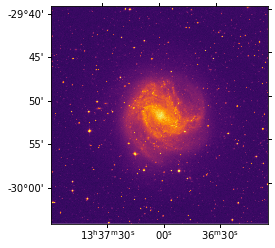

In [15]:

fig = plt.figure() #obviously plotting the figure
ax = fig.add_subplot(111,projection=wcs_map)

#the 111 has to do with the inputs of the data itself, if you change this value, the image will not be created

'''
transformation is between the native spherical coordinates and the projection plane coordinates;
basically plotting the coordinates onto a figure with axes
'''


ax.imshow(im,origin="lower",cmap=cm.inferno)#,vmin=-0.01, vmax=0.06)

"""
image data
(M, N, 3): an image with RGB values (0-1 float or 0-255 int)
    first two dimensions define rows and columns
    last dimension is colormap (cmap)
    when using scalar data and no explicit norm, vmin and vmax define the data range that the colormap covers
    -->colors are constrained
created the image from the flux information
"""


'\ntaking the coordinates of each point we are considering the flux of and then plotting those on the graph\nwx and wy are taken from above\n'

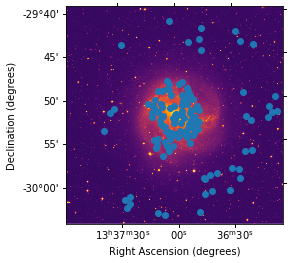

In [16]:

fig = plt.figure()
ax = fig.add_subplot(111,projection=wcs_map)

'''
the 111 has to do with the inputs of the data itself, if you change this value, the image will not be created
'''

ax.imshow(im,origin="lower",cmap=cm.inferno)#,vmin=-0.01, vmax=0.06)
ax.plot(wx,wy,'o')
ax.set_xlabel("Right Ascension (degrees)")
ax.set_ylabel("Declination (degrees)")

'''
taking the coordinates of each point we are considering the flux of and then plotting those on the graph
wx and wy are taken from above
'''


'\ntaking the coordinates of each point we are considering the flux of and then plotting those on the graph\nwx and wy are taken from above\n'

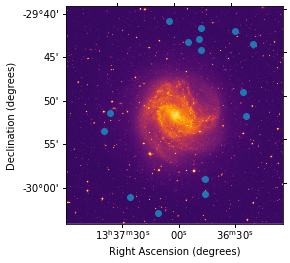

In [19]:
fig = plt.figure()
ax = fig.add_subplot(111,projection=wcs_map)

'''
the 111 has to do with the inputs of the data itself, if you change this value, the image will not be created
'''

indices = [0,1,6,10,13,17,20,41,47,66,75,79,81,112,121]

wxNew=[]
wyNew=[]

for i in range(len(wx)):
    if i in indices:
        wxNew.append(wx[i])
        wyNew.append(wy[i])

ax.imshow(im,origin="lower",cmap=cm.inferno)#,vmin=-0.01, vmax=0.06)
ax.plot(wxNew,wyNew,'o')
ax.set_xlabel("Right Ascension (degrees)")
ax.set_ylabel("Declination (degrees)")

'''
taking the coordinates of each point we are considering the flux of and then plotting those on the graph
wx and wy are taken from above
'''

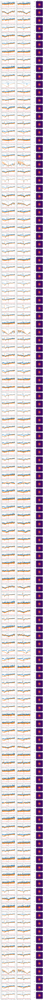

In [33]:
# Now extract an individual spectrum

# Change index to plot the new spectrum ind =[0,125] [ HVC object = ind = 10]

ind=0 #counter variable

xrange=[-1000.,1000.] #setting the range of the data
fig = plt.figure(figsize=(15, 350)) #creating a 1500 x 3500 pixel figure

page_multiplier=1  # This is to jump objects by 10, so always = 1, 10, 20 ,30 ,40 etc.
#the objects being referred to are probably the points themselves

obj_tot=126  # Total objects per page 
obj_tot_page=obj_tot
# To catch the last object
if page_multiplier == 120: 
    obj_tot = 14
    obj_tot_page= 14
    
for i in range(1,obj_tot): #iterating through range of obj_tot
    if i != 1: #if i does NOT equal 1, then returns true
        ind = ind+3 
        #ind increases by 3
        obj_ind +=1 
        #obj_ind adds one
    else: #if i DOES equal 1, then do these below:
        ind= i 
        #ind is returned to 1
        obj_ind= int( (i * page_multiplier)-1) 
        #obj_ind will equal (page_multiplier-1)   
    
    
    ax1 = fig.add_subplot(obj_tot_page,3,ind) #number of rows, 3 columns, index of column
    ax1.step(vel_MWK,flux[:,obj_ind]) #plotting the relative Milky Way velocity using K
    ax1.step(vel_MWK,error[:,obj_ind],'r') #plotting the error of above measurements
    ax1.step(vel_MWH,flux[:,obj_ind]) #plotting relative Milky Way velocity using H
    ax1.plot([0,0],[-2,2],'k--') #plots dashed line down the middle of graph at 0
    ax1.set_xlim(xrange) #regular x-range, defined above
    ax1.set_ylim([0,1.5]) #y-limit is 1.5 because the flux has been normalized
    ax1.text(-280,1.25,'MW') #puts a label of what is being represented
    ax1.text(-280,.25,str(obj_ind)) #writes down the object number/point number on graph
    
    
    ax2 = fig.add_subplot(obj_tot_page,3,ind+1)
    ax2.step(vel_M83K,flux[:,obj_ind])
    ax2.step(vel_M83K,error[:,obj_ind],'r')
    ax2.step(vel_M83H,flux[:,obj_ind])
    ax2.set_xlim(xrange)
    ax2.set_ylim([0,1.5])
    ax2.text(-280,1.25,'M83')
    ax2.plot([0,0],[-2,2],'k--')
    
    #just plots the image of the galaxy and places a gold cross at the point the spectrum is coming from
    ax3 = fig.add_subplot(obj_tot_page,3,ind+2,projection=wcs_map)
    ax3.imshow(im,origin="lower",cmap=cm.inferno)#,vmin=-0.01, vmax=0.06)
    ax3.plot(wx[obj_ind],wy[obj_ind],'+',color='gold',markersize=12)
    ax3.set_title(names[obj_ind])

In [34]:
print(obj_ind)
#number of points that we have the spectra of?

124


204.28366666666318 , -29.84305555555505


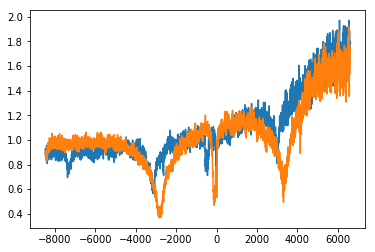

In [35]:
new_index=31
#change the index to get a different plot

plt.plot(vel_MWK,flux[:,new_index]) #plotting the velocity of the Milky Way using K from Ca II and the aggregated flux
#printing the BLUE GRAPH
print(ra[new_index],',',dec[new_index]) #just printing position

plt.plot(vel_MWK,flux[:,81]) #change the index to get a different plot
#printing the ORANGE graph
#plt.xlim([-300,300])


204.23280324073724 , -29.878623456789622


Text(0.5, 1.0, 'Distance Distributions')

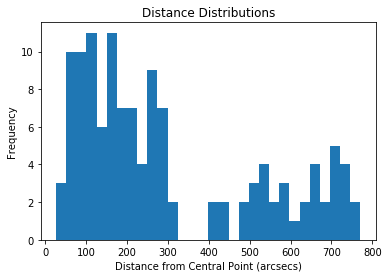

In [36]:
tab=fits.open('SCIENCE_RBNSPECTRA.fits');
info= tab[1].data
#the info variable now contains the position and naming information
#info.columns - assigning the information in the columns to variables
ra=info['RA']
dec=info['DEC']
names=info['object']

#to find central point, take mean of all ra and dec values
x1 = np.mean(ra)
y1 = np.mean(dec)

print(x1, ",", y1)

#for i in range (1, 126):
    #print(ra[i], ",", dec[i])
    #to get right ascension and declination points

#calculating distances between points in arcseconds and (x1,y1), adding to listy
listy = []
for i in range (1,126):
    deltay = (dec[i]-y1)
    deltax = (ra[i]-x1)
    d = (deltay**2 + deltax**2)**0.5
    d_arcsec = d*3600
    #print(d_arcsec)
    listy.append(d_arcsec)
#print(listy)

#create histogram to display these distances from central point
import matplotlib.pyplot as plt
import numpy as np
#matplotlib inline
plt.hist(listy, bins=30)
#plt.axis([0, 800, 0, 30])
plt.ylabel('Frequency')
plt.xlabel('Distance from Central Point (arcsecs)')
plt.title('Distance Distributions')

In [37]:
1./(0.08531028653660916*1e-3)

11721.91585091993

In [38]:
from astropy import units as u
from astropy.coordinates import SkyCoord
c = SkyCoord(ra=ra[new_index]*u.degree, dec=dec[new_index]*u.degree, frame='icrs')
#ICRS = International Celestial Reference System, origin at barycenter of solar system

In [39]:
c.galactic
#galactic position in right ascension and declination

<SkyCoord (Galactic): (l, b) in deg
    (314.61897672, 31.98954005)>

In [40]:
# QUERY Object from GAIA database

from astroquery.gaia import Gaia #when run, it can't find astroquery module?
'''
Gaia is an ambitious mission to chart a three-dimensional map of our Galaxy, 
the Milky Way, in the process revealing the composition, formation and evolution of the Galaxy. 
Gaia will provide unprecedented positional and radial velocity measurements 
with the accuracies needed to produce a stereoscopic and kinematic census of 
about one billion stars in our Galaxy and throughout the Local Group.
'''

coord = SkyCoord(ra=ra[new_index]*u.degree, dec=dec[new_index]*u.degree, frame='icrs')
width = u.Quantity(2, u.arcsec) #width is 2 arcsecs
height = u.Quantity(2, u.arcsec) #height is 2 arcsecs
#.Quantity just assigns units with a measurement
r = Gaia.query_object_async(coordinate=coord, width=width, height=height)
r.pprint()

ModuleNotFoundError: No module named 'astroquery'

In [42]:
indices = [0,1,6,10,13,17,20,40,41,47,48,60,66,71,75,79,81,112,121]

for i in range(len(indices)):
    print (indices[i], ra[indices[i]], dec[indices[i]])

0 204.19662499999657 -29.72013888888839
1 204.19312499999657 -29.742861111110606
6 204.1174583333299 -29.70733333333284
10 204.07658333332992 -29.73216666666616
13 204.26233333332985 -29.68597222222172
17 204.22195833332984 -29.72677777777728
20 204.19233333332988 -29.69947222222171
40 204.36962499999652 -29.72838888888839
41 204.41183333332987 -29.893694444443934
47 204.39749999999654 -29.85799999999949
48 204.38783333332984 -29.8503611111106
60 204.36449999999658 -30.04119444444393
66 204.35654166666325 -30.020999999999486
71 204.19087499999654 -29.986777777777277
75 204.29641666666328 -30.0516111111106
79 204.1889166666632 -29.990083333332826
81 204.18987499999656 -30.01808333333282
112 204.09637499999658 -29.870666666666168
121 204.1013333333299 -29.823749999999492


In [21]:
fig = plt.figure()
ax = fig.add_subplot(111,projection=wcs_map)

'''
the 111 has to do with the inputs of the data itself, if you change this value, the image will not be created
'''

indices = [0,1,6,10,13,17,20,41,47,66,75,79,81,112,121]

wxNew=[]
wyNew=[]

for i in range(len(wx)):
    if i in indices:
        wxNew.append(wx[i])
        wyNew.append(wy[i])

ax.imshow(im,origin="lower",cmap=cm.inferno)#,vmin=-0.01, vmax=0.06)
ax.plot(wxNew,wyNew,'o',c=1000)
ax.colorbar()
ax.set_xlabel("Right Ascension (degrees)")
ax.set_ylabel("Declination (degrees)")

'''
taking the coordinates of each point we are considering the flux of and then plotting those on the graph
wx and wy are taken from above
'''

AttributeError: 'WCSAxesSubplot' object has no attribute 'colorbar'

Error in callback <function install_repl_displayhook.<locals>.post_execute at 0x1210d4950> (for post_execute):


ValueError: Invalid RGBA argument: 1000

ValueError: Invalid RGBA argument: 1000

<Figure size 432x288 with 1 Axes>